In [1]:
from GaussianDiffusion import generate_simplex_4noise
import torch
import numpy as np
import matplotlib.pyplot as plt
import GaussianDiffusion
from simplex import Simplex_CLASS

In [2]:
clssim = Simplex_CLASS()
# clssim.newSeed()

In [15]:
# x = torch.rand(1, 1, 256, 256)
octave=2
persistence=0.8
frequency = 16
num_timesteps = 1000
in_channels = 3

In [16]:
x = torch.rand(10, in_channels, 64, 64)
t = torch.randint(10, num_timesteps, (x.shape[0],), device=x.device)

In [17]:
noise_fn = lambda x, t: torch.randn_like(x)

In [18]:
simplexnoise = GaussianDiffusion.generate_simplex_4noise(x, t, octave=2, frequency=16)

In [19]:
simplexnoise = GaussianDiffusion.generate_simplex_noise_batch(clssim, x, t, octave=2, frequency=16)

In [20]:
simplexnoise = GaussianDiffusion.generate_simplex_4noise(x, t, octave=2, frequency=16)
simplexnoise = GaussianDiffusion.generate_simplex_noise_batch(clssim, x, t, octave=2, frequency=16)
simplexnoise = noise_fn(x, t)

In [21]:
# simplexnoise

In [30]:
import timeit
import matplotlib.pyplot as plt


in_channels = 3
num_timesteps = 1001

def f1(n):
    x = torch.rand(n, in_channels, 64, 64)
    t = torch.randint(n, num_timesteps, (x.shape[0],), device=x.device)
    simplexnoise = GaussianDiffusion.generate_simplex_4noise(x, t, octave=2, frequency=16)
    return simplexnoise

def f2(n):
    x = torch.rand(n, in_channels, 64, 64)
    t = torch.randint(n, num_timesteps, (x.shape[0],), device=x.device)
    simplexnoise = GaussianDiffusion.generate_simplex_noise_batch(clssim, x, t, octave=2, frequency=16)
    return simplexnoise

def f3(n):
    x = torch.rand(n, in_channels, 64, 64)
    t = torch.randint(n, num_timesteps, (x.shape[0],), device=x.device)
    simplexnoise = noise_fn(x, t)
    return simplexnoise
def f4(n):
    x = torch.rand(n, in_channels, 64, 64)
    t = torch.randint(n, num_timesteps, (x.shape[0],), device=x.device)
    simplexnoise = GaussianDiffusion.generate_simplex_4noise(x, t, octave=8, frequency=128)
    return simplexnoise

def f5(n):
    x = torch.rand(n, in_channels, 64, 64)
    t = torch.randint(n, num_timesteps, (x.shape[0],), device=x.device)
    simplexnoise = GaussianDiffusion.generate_simplex_noise_batch(clssim, x, t, octave=8, frequency=128)
    return simplexnoise



In [31]:
noise = f4(100)

In [34]:
# import matplotlib.pyplot as plt
# import torch

# # Assuming your tensor is named 'images'
# images = noise  # Example tensor, replace with your actual tensor

# # Create a 10x10 grid layout
# fig, axs = plt.subplots(10, 10, figsize=(20, 20))

# # Flatten the grid of axes
# axs = axs.flatten()

# # Iterate over the images and plot them
# for i in range(100):
#     img = images[i].permute(1, 2, 0).numpy()  # Convert to numpy array and permute dimensions
#     axs[i].imshow(img)
#     axs[i].axis('off')  # Turn off axis
# plt.tight_layout()  # Adjust layout
# plt.show()


In [ ]:
# Vary the input size (n) as needed
input_sizes = list(range(1, 1000, 20))

# Measure the time taken for each function with different inputs
time_f1 = [timeit.timeit(lambda: f1(n), number=1) for n in input_sizes]
time_f2 = [timeit.timeit(lambda: f2(n), number=1) for n in input_sizes]
time_f3 = [timeit.timeit(lambda: f3(n), number=1) for n in input_sizes]
time_f4 = [timeit.timeit(lambda: f4(n), number=1) for n in input_sizes]
time_f5 = [timeit.timeit(lambda: f5(n), number=1) for n in input_sizes]


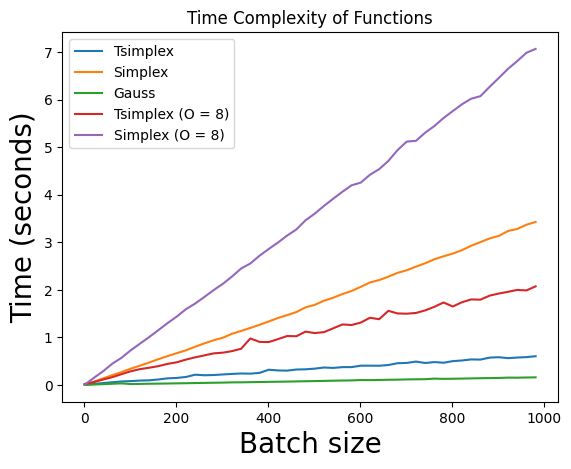

In [12]:
# Plotting the results
plt.plot(input_sizes, time_f1, label='Tsimplex')
plt.plot(input_sizes, time_f2, label='Simplex')
plt.plot(input_sizes, time_f3, label='Gauss')
plt.plot(input_sizes, time_f4, label='Tsimplex (O = 8)')
plt.plot(input_sizes, time_f5, label='Simplex (O = 8)')
plt.xlabel('Batch size', fontsize=20)
plt.ylabel('Time (seconds)', fontsize=20)
plt.title('Time Complexity of Functions')
plt.legend()
plt.show()

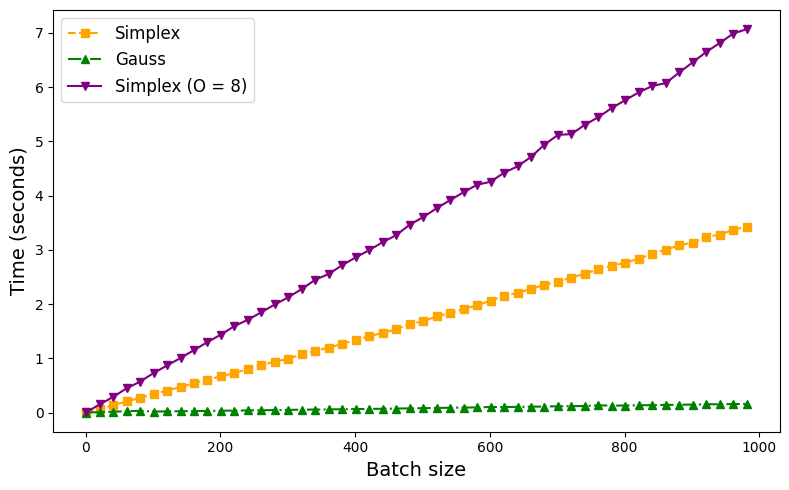

In [17]:

# Your data and plotting code here
plt.figure(figsize=(8, 5))

# Plotting the data with specific markers, linestyles, and labels
# plt.plot(input_sizes, time_f1, marker='o', linestyle='-', color='blue', label='Tsimplex')
plt.plot(input_sizes, time_f2, marker='s', linestyle='--', color='orange', label='Simplex')
plt.plot(input_sizes, time_f3, marker='^', linestyle='-.', color='green', label='Gauss')
# plt.plot(input_sizes, time_f4, marker='D', linestyle=':', color='red', label='Tsimplex (O = 8)')
plt.plot(input_sizes, time_f5, marker='v', linestyle='-', color='purple', label='Simplex (O = 8)')

# Increasing the font size for x-axis and y-axis labels
plt.xlabel('Batch size', fontsize=14)
plt.ylabel('Time (seconds)', fontsize=14)

# Increasing the font size for the legend
plt.legend(fontsize=12)

plt.tight_layout()

In [ ]:
df = pd.DataFrame([input_sizes, time_f1, time_f2, time_f3, time_f4, time_f5])
ddf = df.transpose()
ddf.to_csv(f"Time Complexity (O=8).csv")

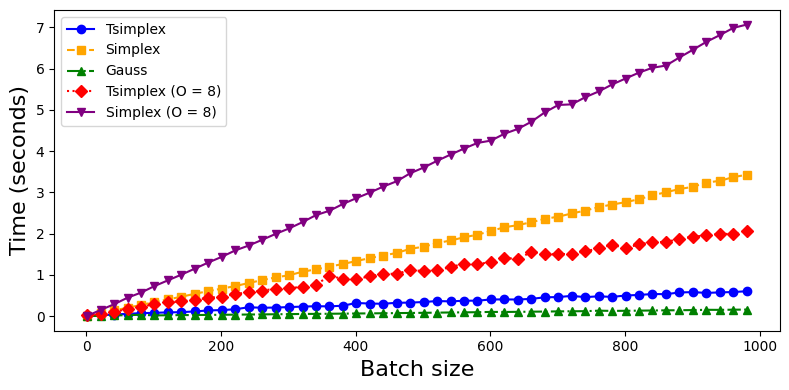

In [15]:
# Plotting the results with enhanced style
plt.figure(figsize=(8, 4))
plt.plot(input_sizes, time_f1, marker='o', linestyle='-', color='blue', label='Tsimplex')
plt.plot(input_sizes, time_f2, marker='s', linestyle='--', color='orange', label='Simplex')
plt.plot(input_sizes, time_f3, marker='^', linestyle='-.', color='green', label='Gauss')
plt.plot(input_sizes, time_f4, marker='D', linestyle=':', color='red', label='Tsimplex (O = 8)')
plt.plot(input_sizes, time_f5, marker='v', linestyle='-', color='purple', label='Simplex (O = 8)')

plt.xlabel('Batch size', fontsize=16)
plt.ylabel('Time (seconds)', fontsize=16)
# plt.title('Time Complexity of Functions', fontsize=16)
plt.legend()
# plt.grid(True)
plt.tight_layout()
# plt.show()
plt.savefig('time_complexity_plot_1.pdf')

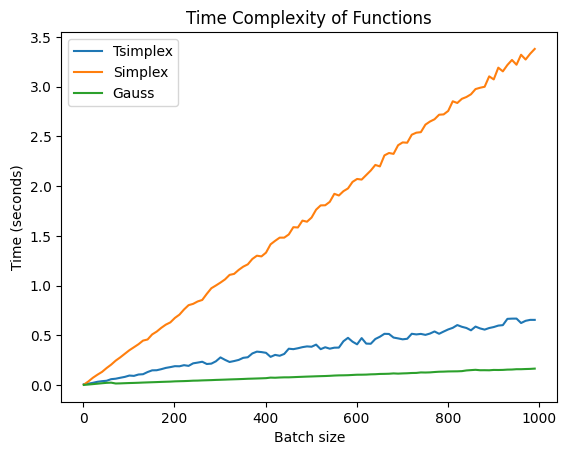

In [37]:
import timeit
import matplotlib.pyplot as plt

# Assuming you have the necessary imports for torch and GaussianDiffusion
# Replace the following imports with your actual imports
# import torch
# from your_module import GaussianDiffusion

# Dummy values for in_channels and num_timesteps
in_channels = 4
num_timesteps = 1001

def f1(n):
    x = torch.rand(n, in_channels, 64, 64)
    t = torch.randint(n, num_timesteps, (x.shape[0],), device=x.device)
    simplexnoise = GaussianDiffusion.generate_simplex_4noise(x, t, octave=2, frequency=16)
    return simplexnoise

def f2(n):
    x = torch.rand(n, in_channels, 64, 64)
    t = torch.randint(n, num_timesteps, (x.shape[0],), device=x.device)
    simplexnoise = GaussianDiffusion.generate_simplex_noise_batch(clssim, x, t, octave=2, frequency=16)
    return simplexnoise

def f3(n):
    x = torch.rand(n, in_channels, 64, 64)
    t = torch.randint(n, num_timesteps, (x.shape[0],), device=x.device)
    simplexnoise = noise_fn(x, t)
    return simplexnoise

# Vary the input size (n) as needed
input_sizes = list(range(1, 1000, 10))

# Measure the time taken for each function with different inputs
time_f1 = [timeit.timeit(lambda: f1(n), number=1) for n in input_sizes]
time_f2 = [timeit.timeit(lambda: f2(n), number=1) for n in input_sizes]
time_f3 = [timeit.timeit(lambda: f3(n), number=1) for n in input_sizes]

# Plotting the results
plt.plot(input_sizes, time_f1, label='Tsimplex')
plt.plot(input_sizes, time_f2, label='Simplex')
plt.plot(input_sizes, time_f3, label='Gauss')

plt.xlabel('Batch size')
plt.ylabel('Time (seconds)')
plt.title('Time Complexity of Functions')
plt.legend()
plt.show()


In [39]:
import pandas as pd

In [40]:
df = pd.DataFrame([time_f1, time_f2, time_f3])
ddf = df.transpose()
ddf.to_csv("Time Complexity.csv")

In [43]:
ddf = df.transpose()

In [46]:
ddf.to_csv("Time Complexity.csv")

In [91]:
path = r"C:\Users\Admin\Dropbox\PC\Documents\Anomaly Detection\AnoDDPM\plotes\SSIM.csv"

In [92]:
csv = pd.read_csv(path)

In [93]:
csv

,Diffusion step,simplex,4dsimplex,gauss,Tsimplex
0,50.0,0.8297,0.7330,0.2535,0.8984
1,65.0,0.7743,0.7040,0.2299,0.8667
2,80.0,0.7275,0.6607,0.2121,0.8208
3,95.0,0.6843,0.6415,0.1920,0.7565
4,111.0,0.6396,0.6003,0.1741,0.7411
...,...,...,...,...,...
995,NaN,NaN,NaN,NaN,NaN
996,NaN,NaN,NaN,NaN,NaN
997,NaN,NaN,NaN,NaN,NaN
998,NaN,NaN,NaN,NaN,NaN


<Figure size 1000x600 with 0 Axes>

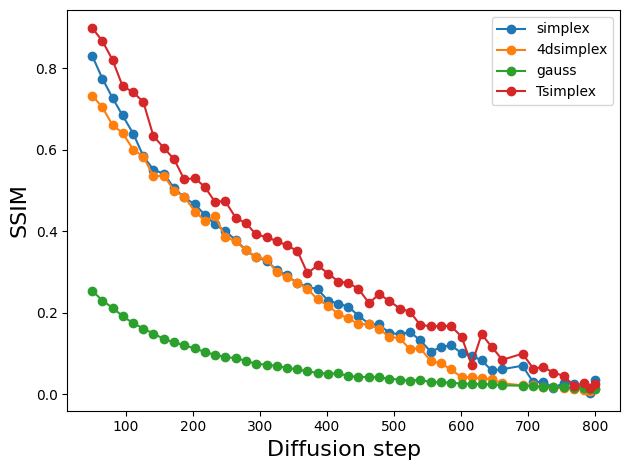

In [106]:
df = csv
plt.figure(figsize=(10, 6))
# Plotting the DataFrame
df.plot(x='Diffusion step', y=['simplex', '4dsimplex', 'gauss', 'Tsimplex'], marker='o' )

plt.xlabel('Diffusion step', fontsize=16)
plt.ylabel('SSIM', fontsize=16)
# plt.grid(True)
plt.tight_layout()
plt.savefig('SSIM_plot.pdf')

In [16]:
import time

# Define your function
def my_function():
    # Your function code here
    pass

# Record the start time
start_time = time.time()

simplexnoise = GaussianDiffusion.generate_simplex_noise_batch(clssim, x, t, octave=8, frequency=128)

# Record the end time
end_time = time.time()

# Calculate the elapsed time
elapsed_time = end_time - start_time

print(f"Function took {elapsed_time:.4f} seconds to run")

Function took 7.0362 seconds to run


In [17]:
import time

# Define your function
def my_function():
    # Your function code here
    pass

# Record the start time
start_time = time.time()

simplexnoise = GaussianDiffusion.generate_simplex_4noise(x, t, octave=8, frequency=128)

# Record the end time
end_time = time.time()

# Calculate the elapsed time
elapsed_time = end_time - start_time

print(f"Function took {elapsed_time:.4f} seconds to run")


Function took 2.3784 seconds to run


In [55]:
import time

# Define your function
def my_function():
    # Your function code here
    pass

# Record the start time
start_time = time.time()

simplexnoise = noise_fn(x, t)

# Record the end time
end_time = time.time()

# Calculate the elapsed time
elapsed_time = end_time - start_time

print(f"Function took {elapsed_time:.4f} seconds to run")


Function took 1.4662 seconds to run


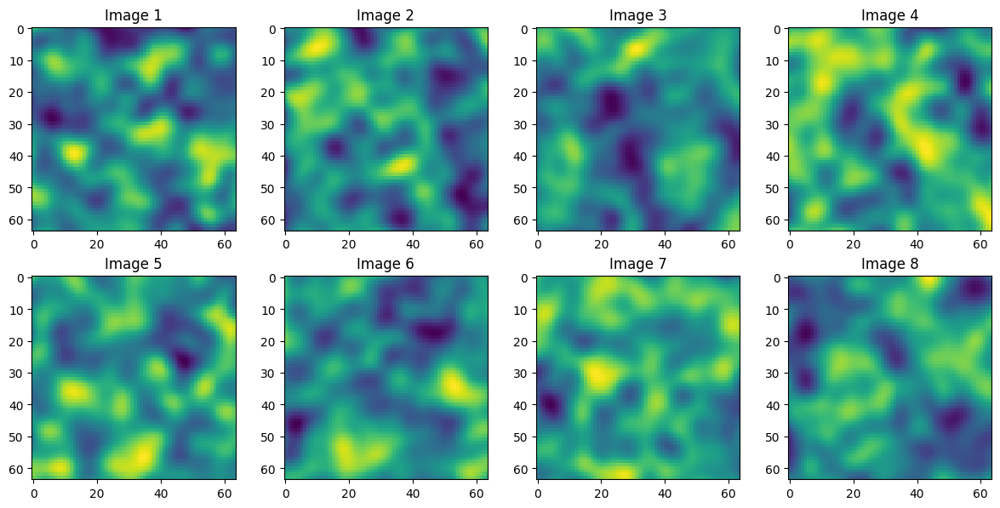

In [32]:
# Plot all images in the batch
fig, axes = plt.subplots(2, 4, figsize=(12, 6))  # Assuming 8 images, arrange in a 2x4 grid

for i in range(8):
    row, col = i // 4, i % 4
    axes[row, col].imshow(simplexnoise[i].permute(1, 2, 0))  # Permute for proper display
    axes[row, col].set_title(f"Image {i+1}")

plt.tight_layout()
plt.show()

In [111]:
x = torch.rand(1, in_channels, 64, 64)
t = torch.randint(0, num_timesteps, (x.shape[0],), device=x.device)
simplexnoise = GaussianDiffusion.generate_simplex_4noise(x, t, octave=1, frequency=4)

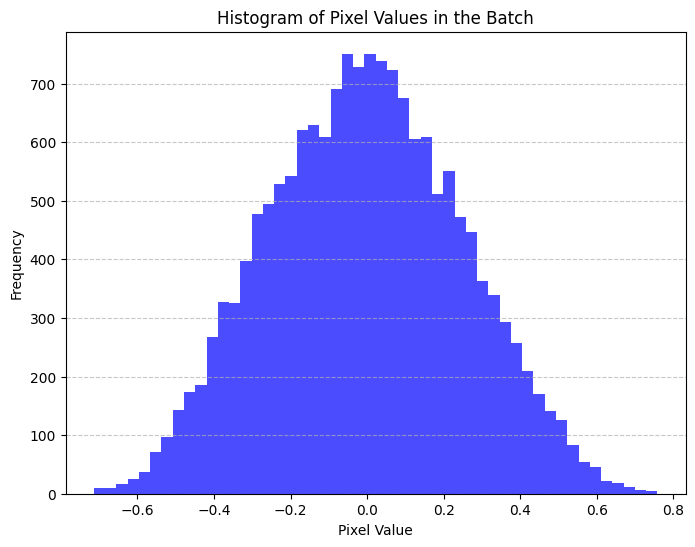

In [112]:
import matplotlib.pyplot as plt
import torch


x = torch.rand(1, in_channels, 64, 64)
t = torch.randint(0, num_timesteps, (x.shape[0],), device=x.device)
simplexnoise = GaussianDiffusion.generate_simplex_4noise(x, t, octave=1, frequency=4)
# Flatten the pixel values of all images in the batch
flat_pixel_values = simplexnoise.view(-1).numpy()

# Create a histogram of pixel values
plt.figure(figsize=(8, 6))
plt.hist(flat_pixel_values, bins=50, color='blue', alpha=0.7)
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.title('Histogram of Pixel Values in the Batch')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


In [127]:
clssim = Simplex_CLASS()

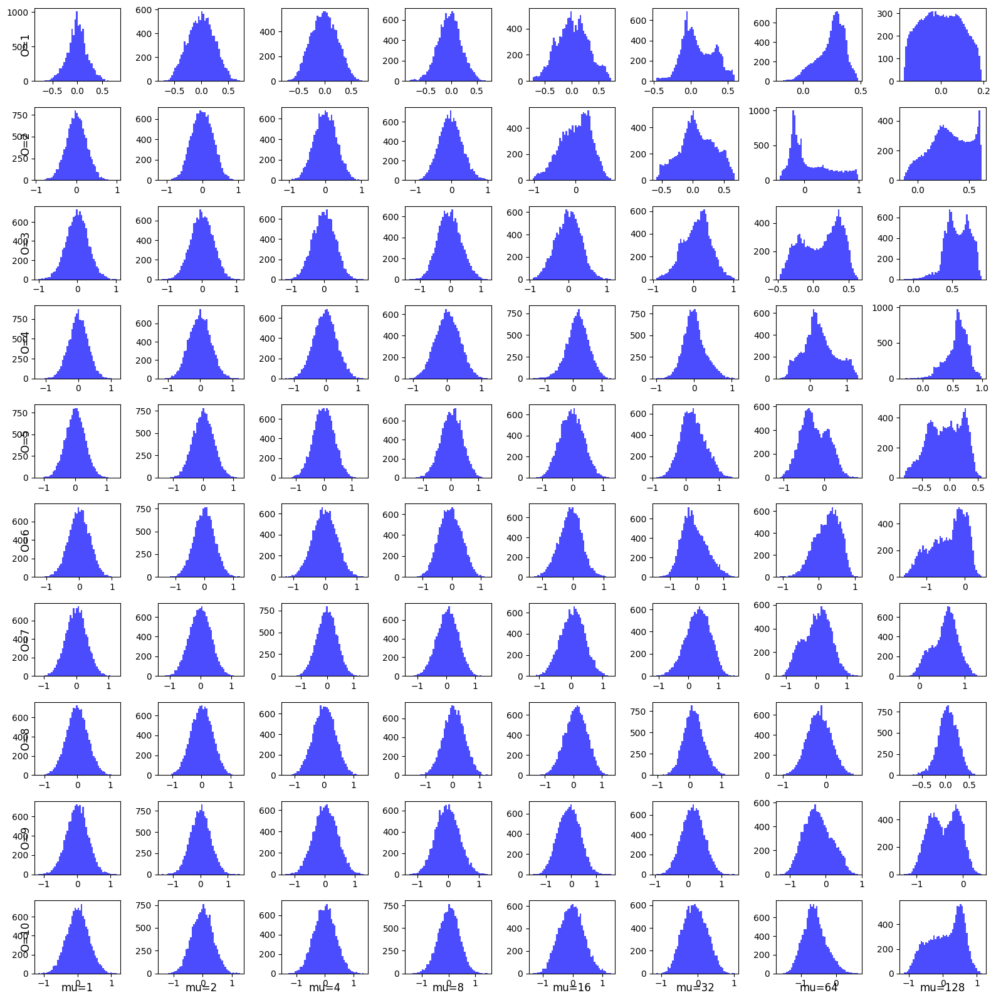

In [15]:
import matplotlib.pyplot as plt
import torch
# from your_module import GaussianDiffusion  # Import the GaussianDiffusion module from your package

in_channels = 3  # Replace with the actual number of input channels
num_timesteps = 10  # Replace with the actual number of time steps

# Create a list to store the histograms
histograms = []

# Loop over different values of octave and frequency
for octave in range(1, 11):
    for exp_frequency in range(8):
        frequency = 2 ** exp_frequency

        x = torch.rand(1, in_channels, 64, 64)
        t = torch.randint(0, num_timesteps, (x.shape[0],), device=x.device)
        simplexnoise = GaussianDiffusion.generate_simplex_4noise(x, t, octave=octave, frequency=frequency)
        flat_pixel_values = simplexnoise.view(-1).numpy()
        histograms.append((octave, frequency, flat_pixel_values))

# Create subplots for each combination of octave and frequency
fig, axs = plt.subplots(10, 8, figsize=(16, 16))

for i, (octave, frequency, flat_pixel_values) in enumerate(histograms):
    row, col = divmod(i, 8)
    axs[row, col].hist(flat_pixel_values, bins=50, color='blue', alpha=0.7)
    axs[row, col].set_title(f'O={octave}, mu={frequency}')

    # Add x and y axis lines
    axs[row, col].axhline(0, color='black', linewidth=1)
    axs[row, col].axvline(0, color='black', linewidth=1)

    # Remove x and y ticks
    axs[row, col].set_xticks([])
    axs[row, col].set_yticks([])

# Set labels for the Octave and Frequency axes
for i in range(10):
    axs[i, 0].text(-0.1, 0.5, f"O={i+1}", fontsize=12, ha='center', va='center', rotation='vertical', transform=axs[i, 0].transAxes)
for j in range(8):
    axs[9, j].text(0.5, -0.2, f"mu={2**j}", fontsize=12, ha='center', va='center', transform=axs[9, j].transAxes)

# Adjust the layout of subplots
plt.tight_layout()

# Show the plot
plt.show()

# fig.savefig("plotes/Timed_simlex_hitogram1", dpi = 300)

In [ ]:
import matplotlib.pyplot as plt
import torch
# from your_module import GaussianDiffusion  # Import the GaussianDiffusion module from your package

in_channels = 1  # Replace with the actual number of input channels
num_timesteps = 10  # Replace with the actual number of time steps

# Create a list to store the histograms
histograms = []

# Loop over different values of octave and frequency
for octave in range(1, 11):
    for exp_frequency in range(8):
        frequency = 2 ** exp_frequency

        x = torch.rand(1, in_channels, 64, 64)
        t = torch.randint(0, num_timesteps, (x.shape[0],), device=x.device)
        simplexnoise = GaussianDiffusion.generate_simplex_noise(clssim, x, t, octave=octave, frequency=frequency)
        flat_pixel_values = simplexnoise.view(-1).numpy()
        histograms.append((octave, frequency, flat_pixel_values))

# Create subplots for each combination of octave and frequency
fig, axs = plt.subplots(10, 8, figsize=(16, 16))

for i, (octave, frequency, flat_pixel_values) in enumerate(histograms):
    row, col = divmod(i, 8)
    axs[row, col].hist(flat_pixel_values, bins=50, color='blue', alpha=0.7)
#     axs[row, col].set_xlabel('Pixel Value')
#     axs[row, col].set_ylabel('Frequency')
    axs[row, col].set_title(f'O={octave}, mu={frequency}')
#     axs[row, col].grid(axis='y', linestyle='--', alpha=0.7)

# Adjust the layout of subplots
plt.tight_layout()

# Show the plot
plt.show()
fig.savefig("plotes/Timed_3dsimlex_hitogram1", dpi = 300)

In [ ]:
import matplotlib.pyplot as plt
import torch
# from your_module import GaussianDiffusion  # Import the GaussianDiffusion module from your package

in_channels = 3  # Replace with the actual number of input channels
num_timesteps = 10  # Replace with the actual number of time steps

# Create a grid of subplots for octave and frequency combinations
fig, axs = plt.subplots(10, 8, figsize=(16, 16))

# Loop over different values of octave and frequency
for octave in range(1, 11):
    for exp_frequency in range(8):
        frequency = 2 ** exp_frequency

        x = torch.rand(1, in_channels, 64, 64)
        t = torch.randint(0, num_timesteps, (x.shape[0],), device=x.device)
        simplexnoise = GaussianDiffusion.generate_simplex_4noise(x, t, octave=octave, frequency=frequency)

        # Plot the image in the corresponding subplot
        row, col = divmod(exp_frequency, 8)
        axs[octave-1, col].imshow(simplexnoise[0].permute(1, 2, 0).cpu().detach().numpy())
        axs[octave-1, col].set_title(f'O={octave}, mu={frequency}')
        axs[octave-1, col].axis('off')

# Adjust the layout of subplots
plt.tight_layout()

# Save the plot as an image file (e.g., PNG)
plt.savefig('octave_frequency_plot.png', dpi=300)

# Show the plot (optional)
plt.show()


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


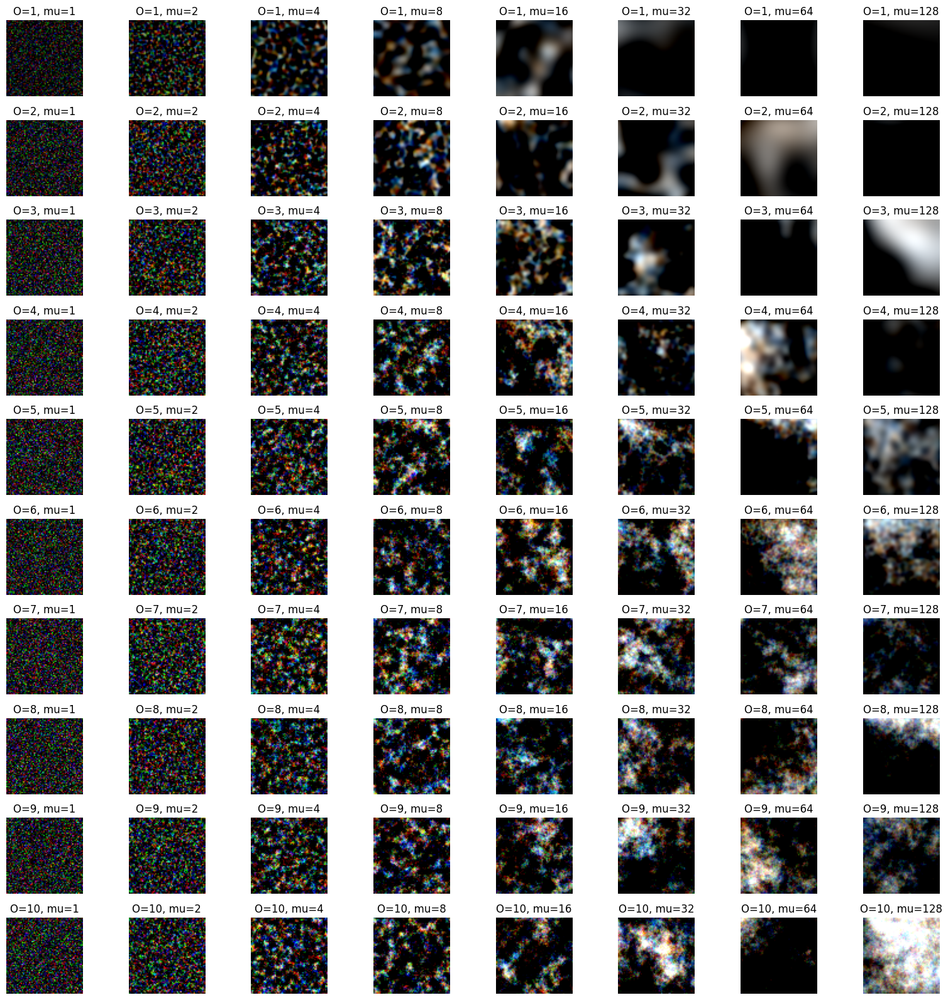

In [123]:
import matplotlib.pyplot as plt
import torch
# from your_module import GaussianDiffusion  # Import the GaussianDiffusion module from your package

in_channels = 3  # Replace with the actual number of input channels
num_timesteps = 10  # Replace with the actual number of time steps

# Create a grid of subplots for octave and frequency combinations
fig, axs = plt.subplots(10, 8, figsize=(16, 16))

# Loop over different values of octave and frequency
for octave in range(1, 11):
    for exp_frequency in range(8):
        frequency = 2 ** exp_frequency

        x = torch.rand(1, in_channels, 64, 64)
        t = torch.randint(0, num_timesteps, (x.shape[0],), device=x.device)
        simplexnoise = GaussianDiffusion.generate_simplex_4noise(x, t, octave=octave, frequency=frequency)

        # Plot the image in the corresponding subplot
        row, col = divmod(exp_frequency, 8)
        axs[octave-1, col].imshow(simplexnoise[0].permute(1, 2, 0).cpu().detach().numpy())
        axs[octave-1, col].set_title(f'O={octave}, mu={frequency}')
        axs[octave-1, col].axis('off')

# Adjust the layout of subplots
plt.tight_layout()

# Save the plot as an image file (e.g., PNG)
plt.savefig('octave_frequency_plot.png', dpi=300)

# Show the plot (optional)
plt.show()


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


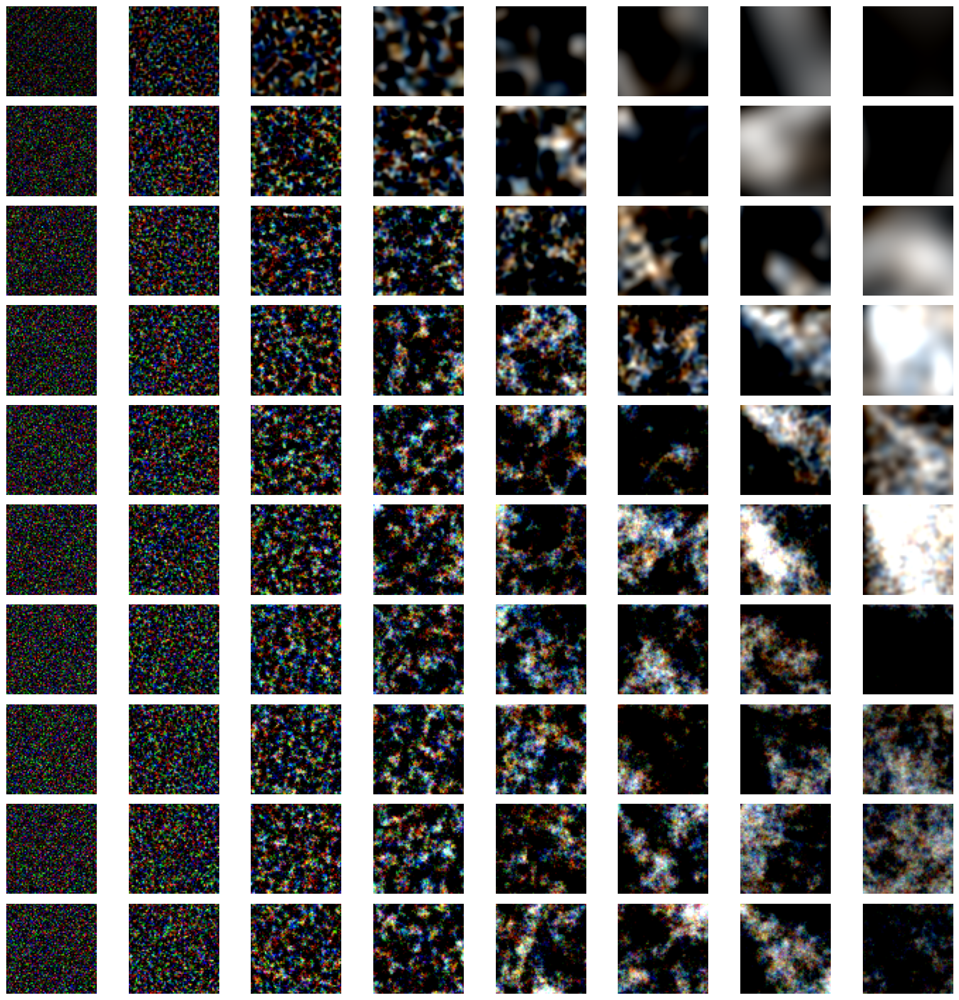

In [8]:
import matplotlib.pyplot as plt
import torch
# from your_module import GaussianDiffusion  # Import the GaussianDiffusion module from your package

in_channels = 3  # Replace with the actual number of input channels
num_timesteps = 10  # Replace with the actual number of time steps

# Create a grid of subplots for octave and frequency combinations
fig, axs = plt.subplots(10, 8, figsize=(16, 16))

# Loop over different values of octave and frequency
for octave in range(1, 11):
    for exp_frequency in range(8):
        frequency = 2 ** exp_frequency

        x = torch.rand(1, in_channels, 64, 64)
        t = torch.randint(0, num_timesteps, (x.shape[0],), device=x.device)
        simplexnoise = GaussianDiffusion.generate_simplex_4noise(x, t, octave=octave, frequency=frequency)

        # Plot the image in the corresponding subplot
        row, col = divmod(exp_frequency, 8)
        axs[octave-1, col].imshow(simplexnoise[0].permute(1, 2, 0).cpu().detach().numpy())
        axs[octave-1, col].axis('off')

# Set the labels for Octave and Frequency on the axes
for i in range(10):
    axs[i, 0].set_ylabel(f"O={i+1}", rotation=0, labelpad=20)
    axs[i, 0].yaxis.set_label_coords(-0.15, 0.5)
for j in range(8):
    axs[9, j].set_xlabel(f"mu={2**j}")

# Adjust the layout of subplots
plt.tight_layout()

# Save the plot as an image file (e.g., PNG)
plt.savefig('octave_frequency_plot.png', dpi=300)

# Show the plot (optional)
plt.show()


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


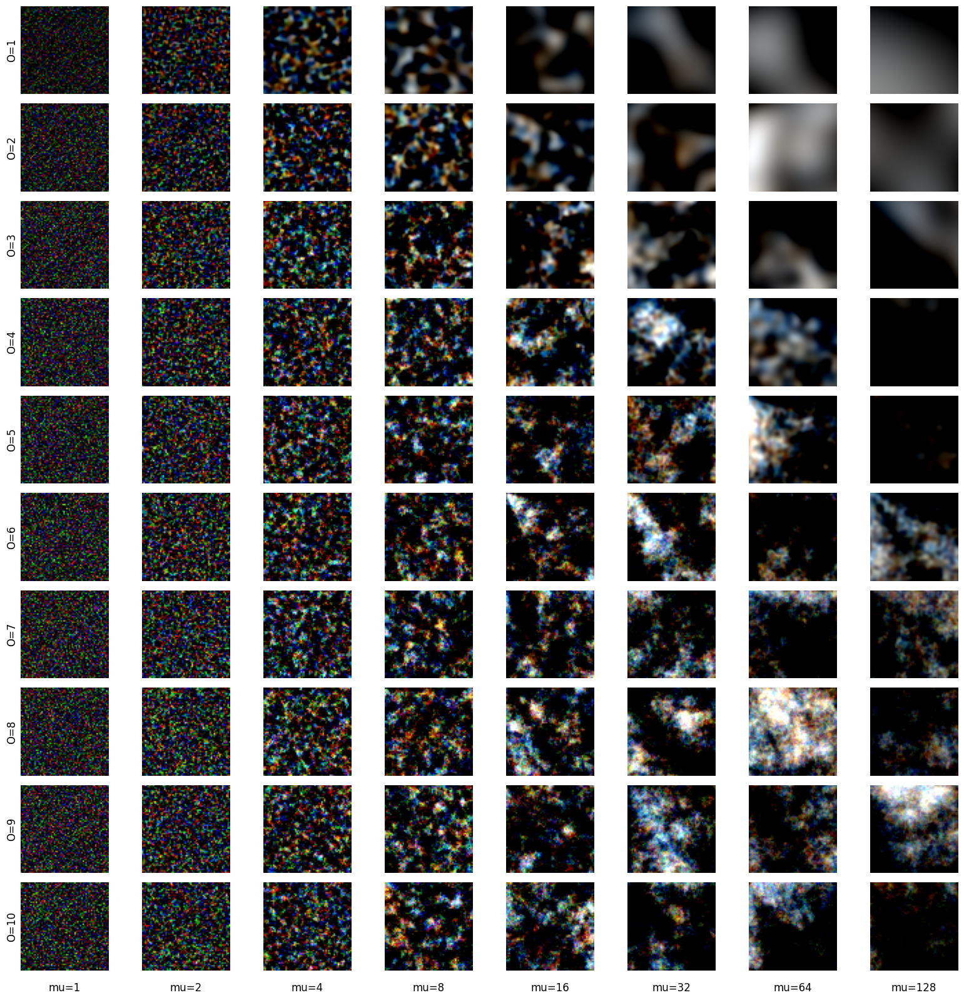

In [10]:
import matplotlib.pyplot as plt
import torch
# from your_module import GaussianDiffusion  # Import the GaussianDiffusion module from your package

in_channels = 3  # Replace with the actual number of input channels
num_timesteps = 10  # Replace with the actual number of time steps

# Create a grid of subplots for octave and frequency combinations
fig, axs = plt.subplots(10, 8, figsize=(16, 16))

# Loop over different values of octave and frequency
for octave in range(1, 11):
    for exp_frequency in range(8):
        frequency = 2 ** exp_frequency

        x = torch.rand(1, in_channels, 64, 64)
        t = torch.randint(0, num_timesteps, (x.shape[0],), device=x.device)
        simplexnoise = GaussianDiffusion.generate_simplex_4noise(x, t, octave=octave, frequency=frequency)

        # Plot the image in the corresponding subplot
        row, col = divmod(exp_frequency, 8)
        axs[octave-1, col].imshow(simplexnoise[0].permute(1, 2, 0).cpu().detach().numpy())
        axs[octave-1, col].axis('off')

# Hide x and y ticks
for ax in axs.flat:
    ax.set_xticks([])
    ax.set_yticks([])

# Set labels for the Octave and Frequency axes
for i in range(10):
    axs[i, 0].text(-0.1, 0.5, f"O={i+1}", fontsize=12, ha='center', va='center', rotation='vertical', transform=axs[i, 0].transAxes)
for j in range(8):
    axs[9, j].text(0.5, -0.2, f"mu={2**j}", fontsize=12, ha='center', va='center', transform=axs[9, j].transAxes)

# Adjust the layout of subplots
plt.tight_layout()

# Save the plot as an image file (e.g., PNG)
plt.savefig('octave_frequency_plot.png', dpi=300)

# Show the plot (optional)
plt.show()


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


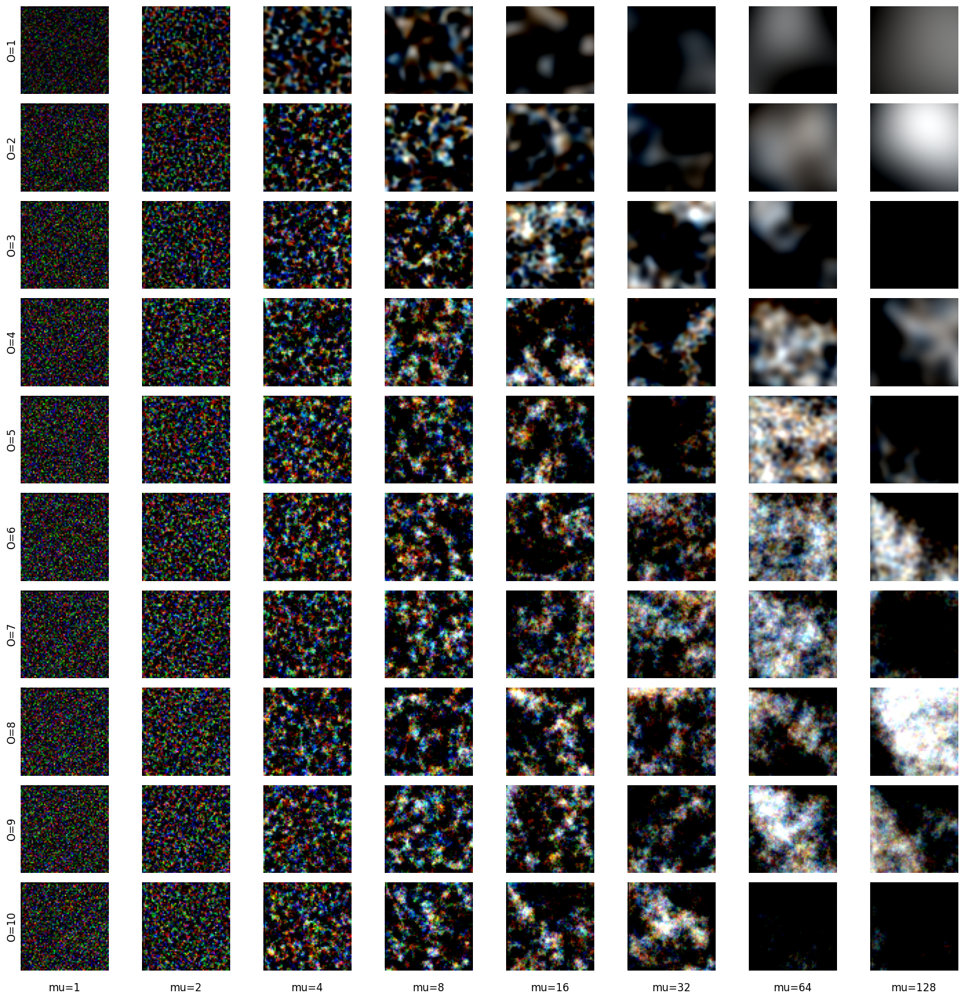

In [11]:
import matplotlib.pyplot as plt
import torch
# from your_module import GaussianDiffusion  # Import the GaussianDiffusion module from your package

in_channels = 3  # Replace with the actual number of input channels
num_timesteps = 10  # Replace with the actual number of time steps

# Create a grid of subplots for octave and frequency combinations
fig, axs = plt.subplots(10, 8, figsize=(16, 16))

# Loop over different values of octave and frequency
for octave in range(1, 11):
    for exp_frequency in range(8):
        frequency = 2 ** exp_frequency

        x = torch.rand(1, in_channels, 64, 64)
        t = torch.randint(0, num_timesteps, (x.shape[0],), device=x.device)
        simplexnoise = GaussianDiffusion.generate_simplex_4noise(x, t, octave=octave, frequency=frequency)

        # Plot the image in the corresponding subplot
        row, col = divmod(exp_frequency, 8)
        axs[octave-1, col].imshow(simplexnoise[0].permute(1, 2, 0).cpu().detach().numpy())
        axs[octave-1, col].axis('off')

# Set labels for the Octave and Frequency axes
for i in range(10):
    axs[i, 0].text(-0.1, 0.5, f"O={i+1}", fontsize=12, ha='center', va='center', rotation='vertical', transform=axs[i, 0].transAxes)
for j in range(8):
    axs[9, j].text(0.5, -0.2, f"mu={2**j}", fontsize=12, ha='center', va='center', transform=axs[9, j].transAxes)

# Add axis lines
for i in range(10):
    axs[i, 0].axhline(0, color='black', linewidth=1)
for j in range(8):
    axs[9, j].axvline(0, color='black', linewidth=1)

# Adjust the layout of subplots
plt.tight_layout()

# Save the plot as an image file (e.g., PNG)
plt.savefig('octave_frequency_plot.png', dpi=300)

# Show the plot (optional)
plt.show()


In [38]:
for i in range(10):
    if i != 5:
        break   
    print(i)


In [41]:
import os
from shutil import copyfile

def save_selected_images(image_list, output_dir):
    # Calculate the indices of the 10 images to save
    indices = [int(i * (len(image_list) - 1) / 9) for i in range(10)]
    
    # Create the output directory if it doesn't exist
    os.makedirs(output_dir, exist_ok=True)
    
    # Save the selected images
    for i in indices:
        image_path = image_list[i]
        output_path = os.path.join(output_dir, os.path.basename(image_path))
        copyfile(image_path, output_path)
        print(f"Saved {image_path} to {output_path}")
    
    print("Finished saving selected images.")

# Example usage:
image_list = ["image1.jpg", "image2.jpg", ..., "image301.jpg"]  # replace with actual paths
output_dir = "selected_images"
save_selected_images(image_list, output_dir)


e


In [50]:
image_list = [[i] for i in range(300)] 

In [54]:
indices = [int(i * (len(image_list)) / 9) for i in range(10)]

In [55]:
indices

[0, 33, 66, 100, 133, 166, 200, 233, 266, 300]